### Data Agumentation

In [ ]:
# 필요한 라이브러리 불러오기
import numpy as np
import pandas as pd
import os

In [ ]:
# 사용할 이미지 불러오기
!curl -O https://www.sciencenews.org/wp-content/uploads/2020/03/033120_HT_covid-cat_feat-1028x579.jpg

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0

100 61745  100 61745    0     0  78291      0 --:--:-- --:--:-- --:--:-- 78356


In [ ]:
# cv 모듈 불러오기 : 이미지 처리 모듈
%pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


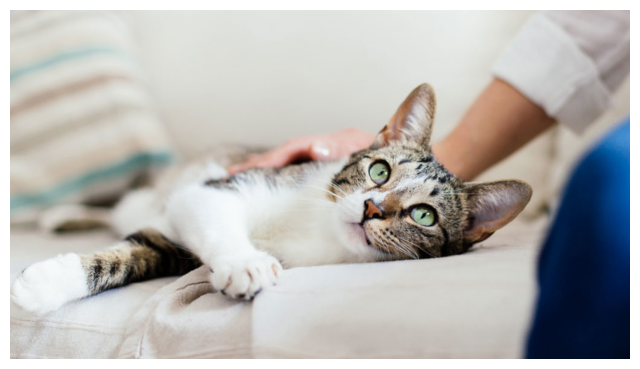

In [ ]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

# cv2 모듈로 이미지 읽어들인다. 이때 채널을 BGR 순으로 읽어오므로, 맷플로립에서 사용하기 위해선 RGB순으로 변환해주어야 한다
image = cv2.cvtColor(cv2.imread('033120_HT_covid-cat_feat-1028x579.jpg'), cv2.COLOR_BGR2RGB)

def show_image(image):
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis('off')

show_image(image)

### ImageDataGenerator 이용해여 Agumentation 적용하기

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# 좌우 반전. 적용 될 수도 있고 안 될 수도 있다
data_generator = ImageDataGenerator(horizontal_flip=True)

# 차원 증가시키기 (원래 fit은 여러개의 이미지를 입력받으므로 4차원으로 맞춰줘야 한다)
image_batch = np.expand_dims(image, axis=0)
print('image batch shape', image_batch.shape)

image batch shape (1, 579, 1028, 3)


In [ ]:
# ImageDataGenerator 적용. fit() > flow 로 이미지 배치 넣어줘야 한다
data_generator.fit(image_batch)
data_gen_iter = data_generator.flow(image_batch)

In [ ]:
# ImageDataGenerator 동작시키기 위해 next로 iteration 호출한다
aug_image_batch = next(data_gen_iter)

In [ ]:
# 반환된 데이터는 4차원 array(배치까지 포함)이므로 다시 3차원으로 변환해준다
aug_image = np.squeeze(aug_image_batch)
print('aug_image shape :', aug_image.shape)

aug_image shape : (579, 1028, 3)


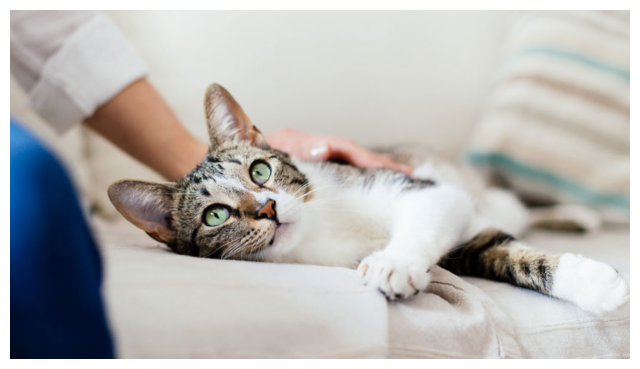

In [ ]:
# 반환된 픽셀 값은 float이므로 다시 int형으로 변경 후 시각화한다
aug_image = aug_image.astype('int')
show_image(aug_image)

### **ImageDataGenerator 이용하여 Agumentation 적용하기**

### 좌우, 상하 반전
- horizontal_flip: 좌우로 랜덤하게 반전 적용.
- virtical_flip: 상하 랜덤하게 반전 적용.


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
# 좌우반전 적용
data_generator = ImageDataGenerator(horizontal_flip=True)

In [ ]:
# 차원확장
image_batch = np.expand_dims(image, axis=0)
print('이미지 배치사이즈:', image_batch.shape)

이미지 배치사이즈: (1, 579, 1028, 3)


In [ ]:
# ImageDataGenerator 적용
data_generator.fit(image_batch)
data_gen_iter = data_generator.flow(image_batch)

In [ ]:
# ImageDataGenerator 동작시키기 위해 next()로 iteration을 호출한다
aug_image_batch = next(data_gen_iter)

In [ ]:
# 반환된 데이터는 4차원이므로 다시 3차원 image array로 변환한다
aug_image = np.squeeze(aug_image_batch)
print('배치 사이즈 :', aug_image.shape)

배치 사이즈 : (579, 1028, 3)


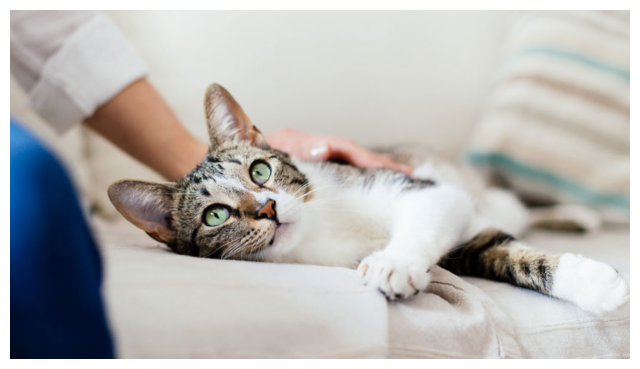

In [ ]:
# 반환된 픽셀값을 flot이므로 다시 int형으로 변환해준다
aug_image = aug_image.astype('int')
show_image(aug_image)

### 여러 이미지의 ImageDataGenerator 변환을 수행하는 함수 생성
ImageDataGenerator는 next()로 호출 시마다 이미지 agumentation이 적용됨을 이용해 한 번에 여러 이미지를 변환해보자

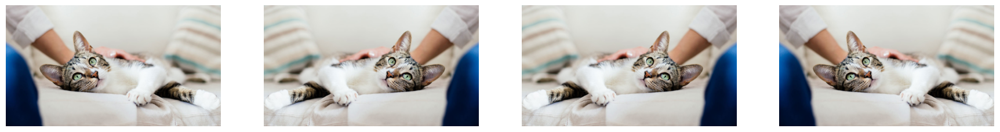

In [ ]:
N_IMAGES = 4
fig, axs = plt.subplots(nrows=1, ncols=N_IMAGES, figsize=(22,8))

for i in range(N_IMAGES) :
  aug_image_batch = next(data_gen_iter)
  aug_image = np.squeeze(aug_image_batch)
  aug_image = aug_image.astype(int)
  axs[i].imshow(aug_image)
  axs[i].axis('off')

In [ ]:
# ImageDataGenerator 객체를 입력하면 augmentation 적용된 일련의 image들을 시각화 해주는 함수 생성.
def show_aug_image_batch(image, data_generator, n_images=4, to_int=True):

  image_batch = np.expand_dims(image, axis=0)
  # ImageDataGenerator 적용. fit()후 flow()로 image batch를 넣어주어야 함.
  data_generator.fit(image_batch)
  data_gen_iter = data_generator.flow(image_batch)

  fig, axs = plt.subplots(nrows=1, ncols=n_images, figsize=(6*n_images, 8))

  for i in range(n_images):
      aug_image_batch = next(data_gen_iter)
      aug_image = np.squeeze(aug_image_batch)
      if(to_int):
          aug_image = aug_image.astype('int')
      axs[i].imshow(aug_image)
      axs[i].axis('off')


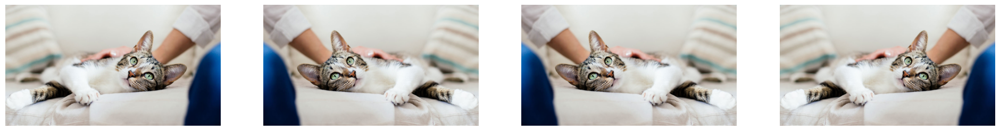

In [ ]:
# 좌우반전
data_generator = ImageDataGenerator(horizontal_flip=True)
show_aug_image_batch(image, data_generator, n_images=4)

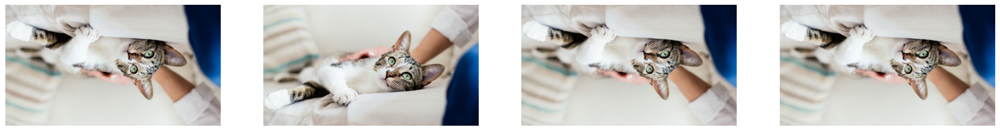

In [ ]:
# 상하 반전 적용
data_generator = ImageDataGenerator(vertical_flip=True)
show_aug_image_batch(image, data_generator, n_images=4)

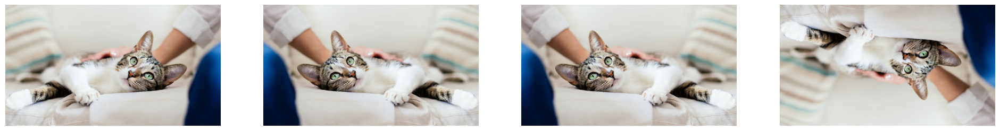

In [ ]:
# 상하, 좌우 반전 함께 적용
data_generator = ImageDataGenerator(horizontal_flip=True, vertical_flip=True)
show_aug_image_batch(image, data_generator, n_images=4)

### 이미지 회전 적용

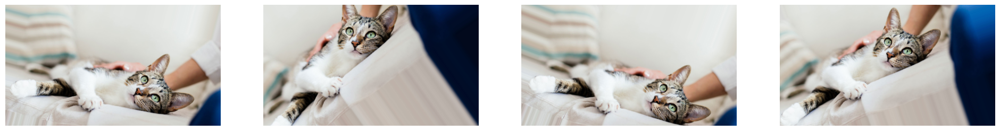

In [ ]:
# rotation 범위를 -45 ~ 45도로 설정.
data_gen = ImageDataGenerator(rotation_range=45)
show_aug_image_batch(image, data_gen, n_images=4)

### 이미지 좌우 상하 이동

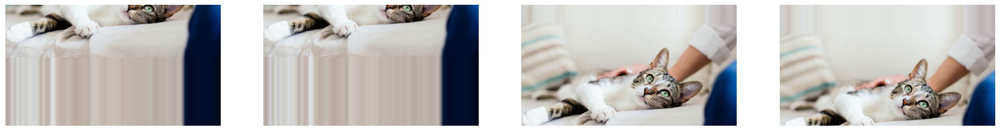

In [ ]:
# 너비 이동 (상하)
data_generator = ImageDataGenerator(width_shift_range=0.4)
show_aug_image_batch(image, data_generator, n_images=4)

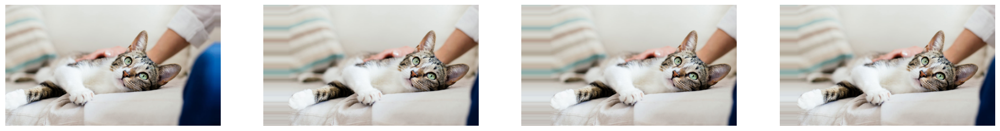

In [ ]:
# 높이 이동(좌우)
data_generator =ImageDataGenerator(height_shift_range=0.4)
show_aug_image_batch(image, data_generator, n_images=4)

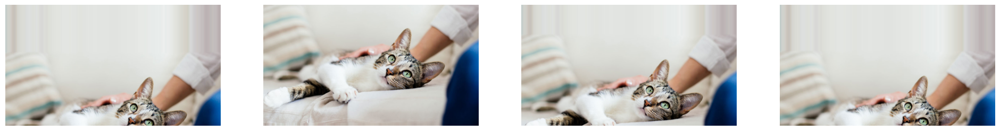

In [ ]:
# fillmode

# 빈 공간을 가장 가까운 곳의 픽셀값으로 채움
data_generator = ImageDataGenerator(width_shift_range=0.4, fill_mode='nearest')
show_aug_image_batch(image, data_generator, n_images=4)

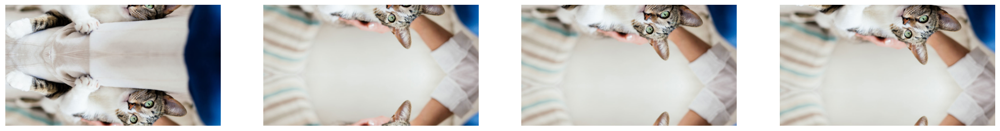

In [ ]:
# 빈 공간을 잘린 축을 기준으로 원본 이미지를 반전시킴
data_generator = ImageDataGenerator(width_shift_range=0.4, fill_mode='reflect')
show_aug_image_batch(image, data_generator, n_images=4)

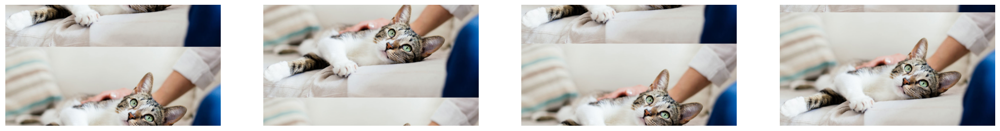

In [ ]:
# 빈 공간을 잘려나간 이미지로 채움
data_generator = ImageDataGenerator(width_shift_range=0.4, fill_mode='wrap')
show_aug_image_batch(image, data_generator, n_images=4)

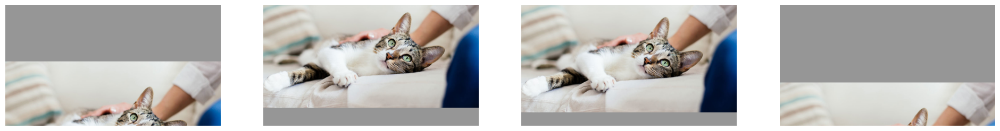

In [ ]:
# 빈 공간을 특정 픽셀값으로 채움. cval = 특정 픽셀값
data_generator = ImageDataGenerator(width_shift_range=0.4, fill_mode='constant', cval=150)
show_aug_image_batch(image, data_generator, n_images=4)

### Zoom(Scale) 적용

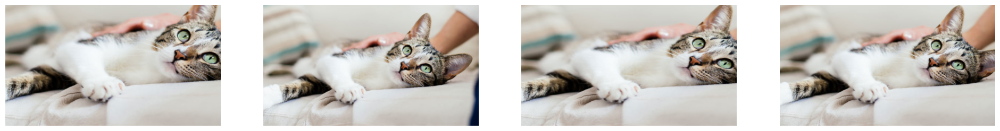

In [ ]:
# Zoom In (확대) : 1보다 작은 값을 범위로 입력
data_generator = ImageDataGenerator(zoom_range=[0.5,0.9])
show_aug_image_batch(image, data_generator, n_images=4)

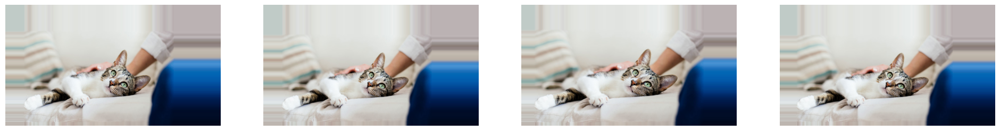

In [ ]:
# Zoom out (축소) : 1보다 큰 값을 범위로 입력
data_generator = ImageDataGenerator(zoom_range=[1.2,1.5])
show_aug_image_batch(image, data_generator, n_images=4)

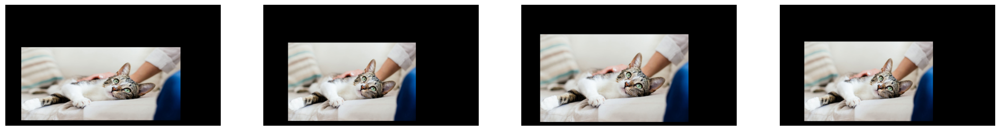

In [ ]:
# Zoon Out시 비어있는 공간 채우기
data_generator = ImageDataGenerator(zoom_range=[1.3,1.7], fill_mode='constant', cval=0)
show_aug_image_batch(image, data_generator, n_images=4)

### Shear
이미지 비틀기. 45일경우 -45~45 사이에서 변환 적용

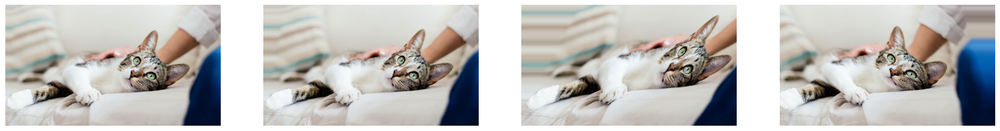

In [ ]:
data_generator = ImageDataGenerator(shear_range=45)
show_aug_image_batch(image, data_generator, n_images=4)

### Bright 적용
brightness_range. 0~1 사이 값 입력. 0에 가까울수록 원본보다 어둡고, 1보다 처질수록 원본보다 밝음

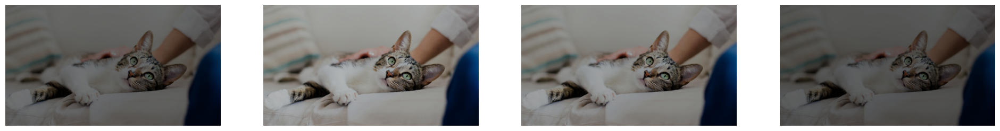

In [ ]:
data_generator = ImageDataGenerator(brightness_range=(0.1,0.9))
show_aug_image_batch(image, data_generator, n_images=4)

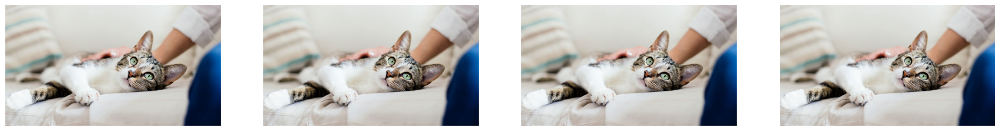

In [ ]:
data_generator = ImageDataGenerator(brightness_range=(1.0,1.0))
show_aug_image_batch(image, data_generator, n_images=4)

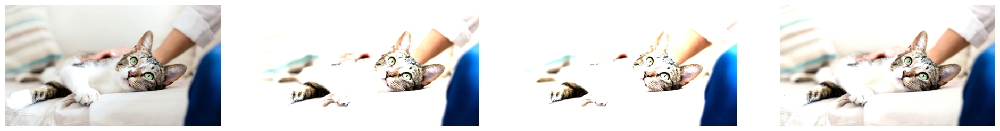

In [ ]:
data_generator = ImageDataGenerator(brightness_range=(1.0,2.0))
show_aug_image_batch(image, data_generator, n_images=4)

### Channel Shift
- 원본 이미지의 RGB값을 정한 범위 내의 임의의 값으로 변환

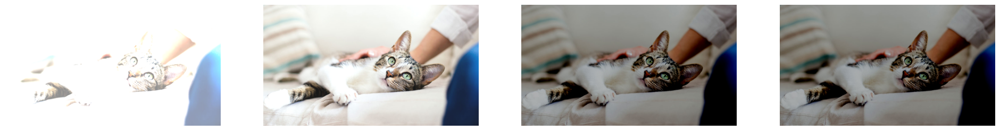

In [ ]:
data_generator = ImageDataGenerator(channel_shift_range=150.0)
show_aug_image_batch(image, data_generator, n_images=4)

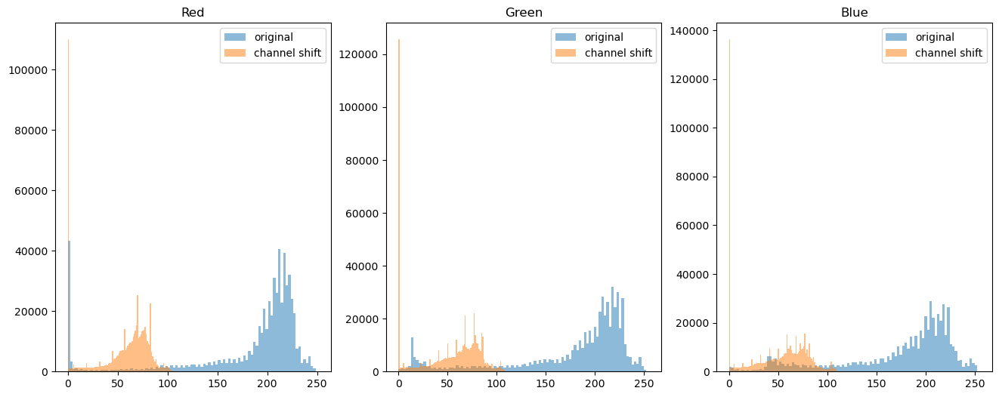

In [ ]:
# aug_image를 int로 변환 X. float로 그대로 유지하여 변환한다. (데이터 정밀도 문재)
def get_aug_image(image, data_generator):
    # ImageDataGenerator는 여러개의 이미지를 입력받음. 3차원이 아니라 batch를 포함한 4차원 array를 입력받음. np.expand_dims()로 차원을 증가시켜준다
    image_batch = np.expand_dims(image, axis=0)

    # ImageDataGenerator 적용시켜준다. fit() > flow() 로 image batch 넣어준다
    data_generator.fit(image_batch)
    data_gen_iter = data_generator.flow(image_batch)

    # next() 로 iteration 호출하여 ImageDataGenerator 동작시킨다
    aug_image_batch = next(data_gen_iter)

    # 반환된 데이터는 batch 포함한 4차원 array이므로 다시 3차원으로 변환해준다
    aug_image = np.squeeze(aug_image_batch)

    # aug_image를 Int형으로 변환 않고 float로 그대로 유지한다
    aug_image = aug_image

    return aug_image

data_generator = ImageDataGenerator(channel_shift_range=150.0)
aug_image = get_aug_image(image, data_generator) # chaneel_shift된 이미지

# RGB 모든 채널에 대해 원본과 변환 이미지 Pixel값의 히스토그램 시각화
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(16,6))

for i in range(3):
    # i가 0,1,2 일때 각각 R, G, B 채널에 대한 히스토그램 표현한다
    axs[i].hist(image[:,:,i].flatten(), bins=100, alpha=0.5, label="original")
    axs[i].hist(aug_image[:,:,i].flatten(), bins=100, alpha=0.5, label="channel shift") # bin : 구간수, alpha : 투명도
    axs[i].legend(loc='upper right')

    if i == 0 :
      title_str = 'Red'
    elif i == 1 :
      title_str = 'Green'
    else :
      title_str = 'Blue'

    axs[i].set_title(title_str) # 각각의 subplot에 해당 변수로 제목 설정

### Normalization
- 일반적으로 augmentation 용도가 아닌 CNN 입력 값으로 Pixel값 변환을 위해 0~1사이의 값으로 변환하거나 채널별 Z score변환(평균 0, 표준편차 1) 적용
- featurewise_center = True이면 R, G, B 각 픽셀값에서 개별 채널들의 평균 픽셀값을 빼서 평균을 0으로 함.
- featurewise_std_normalization = True이면 R, G, B 각 픽셀값에서 개별 채널들의 표준 편차값으로 나눔.
- rescale = 255.0 각 픽셀값을 0 ~ 1사이의 값으로 만들기 위해서 보통 255.0 으로 나눔.

In [ ]:
r_mean = np.mean(image[:,:,0])
g_mean = np.mean(image[:,:,1])
b_mean = np.mean(image[:,:,2])

r_std = np.std(image[:,:,0])
g_std = np.std(image[:,:,1])
b_std = np.std(image[:,:,2])

print(r_mean, g_mean, b_mean, r_std, g_std, b_std )

r_zscore = (image[:,:,0] - r_mean) / r_std
g_zscore = (image[:,:,0] - g_mean) / g_std
b_zscore = (image[:,:,0] - b_mean) / b_std

print(r_zscore, r_zscore ,g_zscore, b_zscore)

178.1461227260203 176.28255646727553 173.6606738439413 65.90277949962356 62.48317182871674 57.52425459226215
[[ 0.21021689  0.22539076  0.24056462 ...  0.13434755  0.13434755
   0.13434755]
 [ 0.22539076  0.24056462  0.25573849 ...  0.13434755  0.13434755
   0.13434755]
 [ 0.24056462  0.27091236  0.28608622 ...  0.13434755  0.13434755
   0.13434755]
 ...
 [ 0.22539076  0.27091236  0.05847822 ... -2.67281781 -2.67281781
  -2.67281781]
 [ 0.08882595  0.16469529  0.01295662 ... -2.67281781 -2.67281781
  -2.67281781]
 [ 0.16469529  0.30126009  0.22539076 ... -2.67281781 -2.67281781
  -2.67281781]] [[ 0.21021689  0.22539076  0.24056462 ...  0.13434755  0.13434755
   0.13434755]
 [ 0.22539076  0.24056462  0.25573849 ...  0.13434755  0.13434755
   0.13434755]
 [ 0.24056462  0.27091236  0.28608622 ...  0.13434755  0.13434755
   0.13434755]
 ...
 [ 0.22539076  0.27091236  0.05847822 ... -2.67281781 -2.67281781
  -2.67281781]
 [ 0.08882595  0.16469529  0.01295662 ... -2.67281781 -2.67281781
  -2

In [ ]:
# featurewise_center=True, featurewise_std_normalization=True 적용하여 z-scoroe값 얻기
data_generator = ImageDataGenerator(featurewise_center=True, featurewise_std_normalization=True)
image_batch = np.expand_dims(image, axis=0)

# ImageDataGenerator 적용 fit() > flow()
data_generator.fit(image_batch)
data_gen_iter = data_generator.flow(image_batch)

aug_image_batch = next(data_gen_iter)

aug_image = np.squeeze(aug_image_batch)
aug_image

array([[[ 0.21212701,  0.42733452,  0.43951732],
        [ 0.22730476,  0.4433401 ,  0.4569007 ],
        [ 0.2424825 ,  0.45934564,  0.47428405],
        ...,
        [ 0.13623834,  0.02719526,  0.09185016],
        [ 0.13623834,  0.02719526,  0.09185016],
        [ 0.13623834,  0.02719526,  0.09185016]],

       [[ 0.22730476,  0.4433401 ,  0.4569007 ],
        [ 0.2424825 ,  0.45934564,  0.47428405],
        [ 0.25766024,  0.4433401 ,  0.47428405],
        ...,
        [ 0.13623834,  0.02719526,  0.09185016],
        [ 0.13623834,  0.02719526,  0.09185016],
        [ 0.13623834,  0.02719526,  0.09185016]],

       [[ 0.2424825 ,  0.45934564,  0.47428405],
        [ 0.27283797,  0.45934564,  0.4916674 ],
        [ 0.2880157 ,  0.4753512 ,  0.5090508 ],
        ...,
        [ 0.13623834,  0.02719526,  0.09185016],
        [ 0.13623834,  0.02719526,  0.09185016],
        [ 0.13623834,  0.02719526,  0.09185016]],

       ...,

       [[ 0.22730476,  0.15523982,  0.10923351],
        [ 0

In [ ]:
data_generator = ImageDataGenerator(rescale=1/255.0)
aug_image = get_aug_image(image, data_generator)
print(aug_image)

[[[0.75294125 0.7960785  0.7803922 ]
  [0.7568628  0.8000001  0.7843138 ]
  [0.7607844  0.80392164 0.78823537]
  ...
  [0.73333335 0.69803923 0.7019608 ]
  [0.73333335 0.69803923 0.7019608 ]
  [0.73333335 0.69803923 0.7019608 ]]

 [[0.7568628  0.8000001  0.7843138 ]
  [0.7607844  0.80392164 0.78823537]
  [0.76470596 0.8000001  0.78823537]
  ...
  [0.73333335 0.69803923 0.7019608 ]
  [0.73333335 0.69803923 0.7019608 ]
  [0.73333335 0.69803923 0.7019608 ]]

 [[0.7607844  0.80392164 0.78823537]
  [0.7686275  0.80392164 0.79215693]
  [0.7725491  0.8078432  0.7960785 ]
  ...
  [0.73333335 0.69803923 0.7019608 ]
  [0.73333335 0.69803923 0.7019608 ]
  [0.73333335 0.69803923 0.7019608 ]]

 ...

 [[0.7568628  0.7294118  0.7058824 ]
  [0.7686275  0.7411765  0.7176471 ]
  [0.7137255  0.6784314  0.65882355]
  ...
  [0.00784314 0.03529412 0.10980393]
  [0.00784314 0.03529412 0.10980393]
  [0.00784314 0.03529412 0.10980393]]

 [[0.72156864 0.69411767 0.67058825]
  [0.7411765  0.7137255  0.6901961 ]


### Putting all together
기법을 한번에 여러개 적용해보기

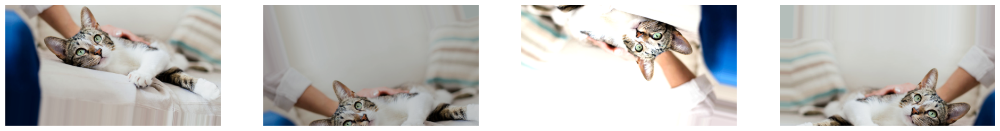

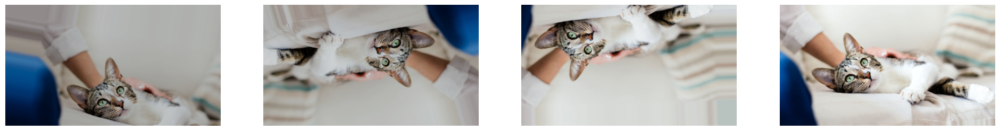

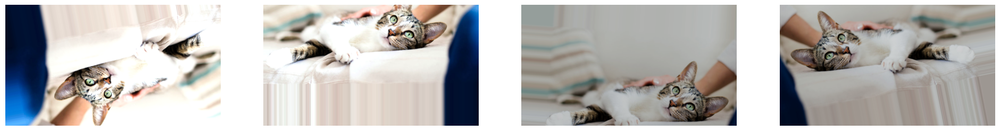

In [ ]:
data_generator = ImageDataGenerator(
  rotation_range=20,
  width_shift_range=0.2,
  height_shift_range=0.2,
  brightness_range=(0.7, 1.3),
  horizontal_flip=True,
  vertical_flip=True
)

show_aug_image_batch(image, data_generator, n_images=4)
show_aug_image_batch(image, data_generator, n_images=4)
show_aug_image_batch(image, data_generator, n_images=4)